Inspect random neuron cropa from both datasets to ensure validity. 
This notebook samples, loads and viualizes images to verify data quality.

In [3]:
!which python
!pip install numpy matplotlib pandas seaborn scikit-learn torch torchvision tqdm

/Users/carolinalangaro/miniforge3/bin/python


Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 24.0 -> 25.3
[notice] To update, run: pip3 install --upgrade pip
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 24.0 -> 25.3
[notice] To update, run: pip3 install --upgrade pip
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 24.0 -> 25.3
[notice] To update, run: pip3 install --upgrade pip
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 24.0 -> 25.3
[notice] To update, run: pip3 install --upgrade pip
Note: you may need to restart the kernel to use up

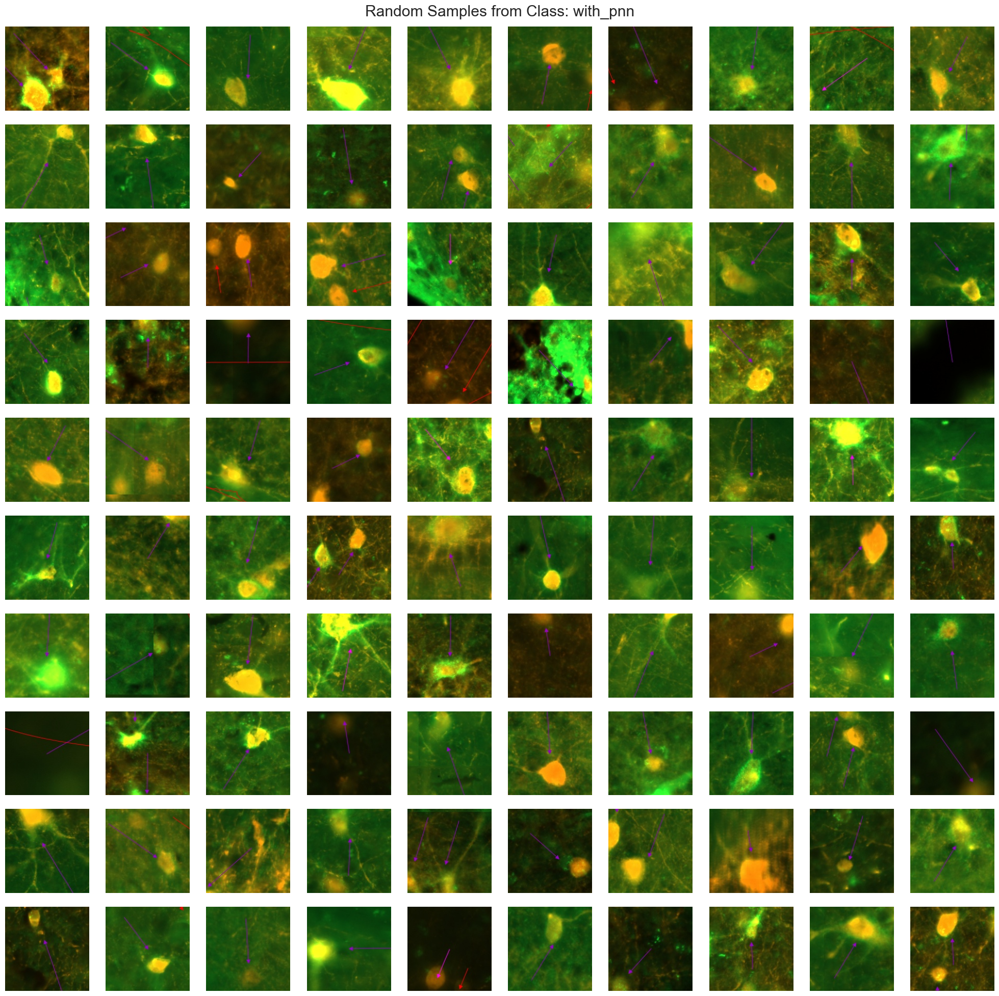

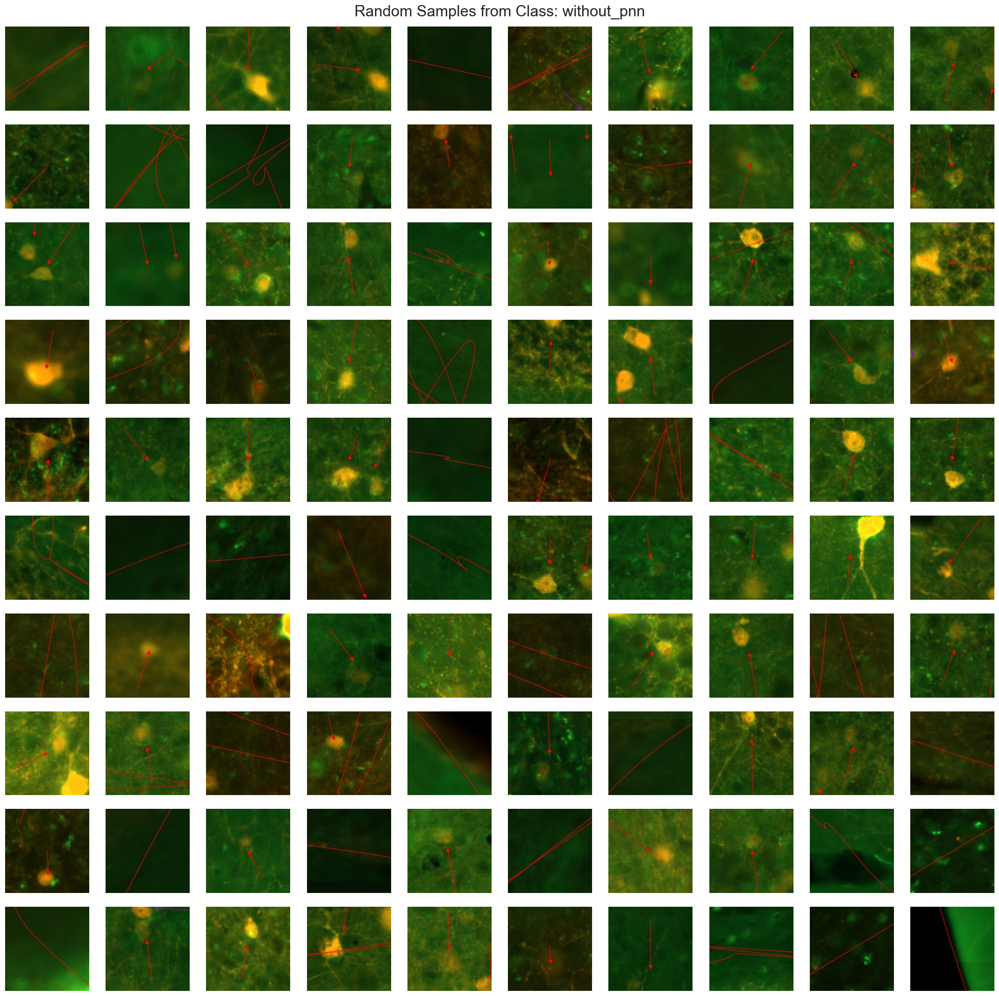

In [8]:



%pip install pandas
%pip install opencv-python
%pip install matplotlib
%pip install seaborn

from pathlib import Path
import random 
import numpy as np
import matplotlib.pyplot as plt
import cv2
import seaborn as sns
import pandas as pd
    
# constants 
DATASET_DIR = Path("../dataset/")
CLASSES = ["with_pnn", "without_pnn"]
SAMPLES_PER_CLASS = 100 
RANDOM_SEED = 42

# set global style for plots 
sns.set_context("talk")
sns.set_style("whitegrid")
random.seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)

# Helper functions
def load_random_crops(dataset_dir: Path, classes: list[str], samples_per_class: int) -> dict[str, list[np.ndarray]]:
    """Load random image crops from each class directory."""
    samples = {}
    for cls in classes:
        folder = dataset_dir / cls
        image_files = list(folder.glob("*.png"))
        if not image_files:
            raise ValueError(f"No images found in {folder}")
            samples[cls] = []
            continue
        selected_files = random.sample(image_files, min(samples_per_class, len(image_files)))
        imgs = [cv2.cvtColor(cv2.imread(str(img_file)), cv2.COLOR_BGR2RGB) for img_file in selected_files]
        samples[cls] = imgs
        print(f"Loaded {len(imgs)} images from class '{cls}'")
    return samples

def plot_grif(images: list[list[np.ndarray]], ncols: int = 10, title: str = "") -> None:
    """Plot a grid of images."""
    nrows = (len(images) + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 2, nrows * 2))
    axes = axes.flatten()
    for ax, img in zip(axes, images):
        ax.imshow(img)
        ax.axis("off")
    for ax in axes[len(images):]:
        ax.axis("off")
    if title:
        plt.suptitle(title)
    plt.tight_layout()
    plt.show()

# Load random crops
samples = load_random_crops(DATASET_DIR, CLASSES, SAMPLES_PER_CLASS)
# Plot samples from each class
for cls, imgs in samples.items():
    plot_grif(imgs, ncols=10, title=f"Random Samples from Class: {cls}")

    